In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path='drive/My Drive/m22ee002'

#  OpenCV library harris Corner detection

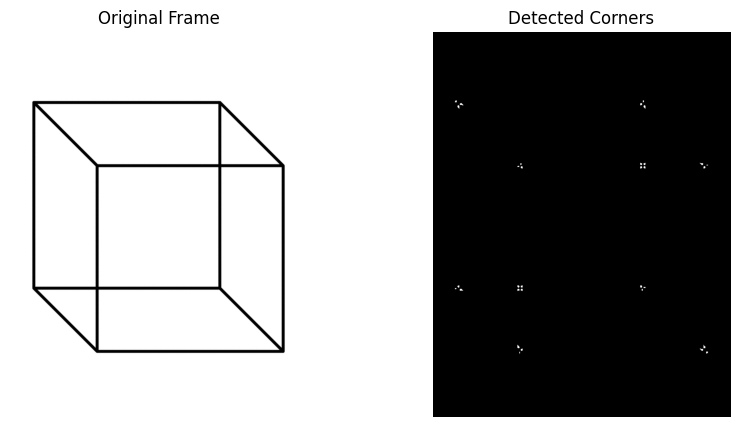

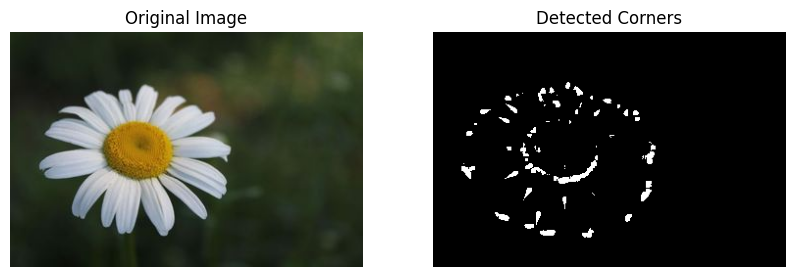

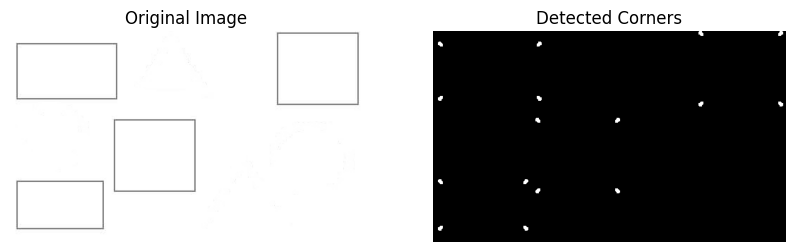

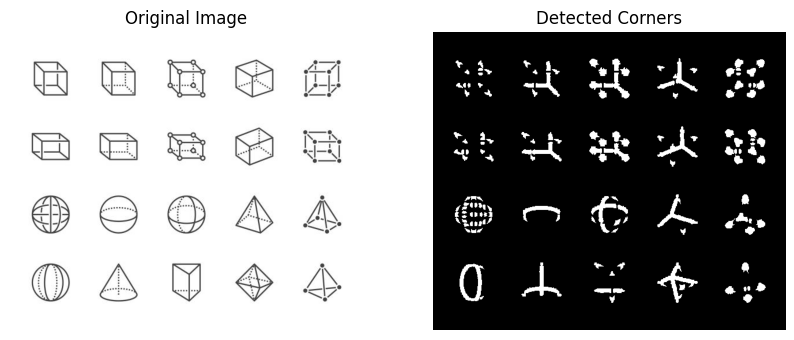

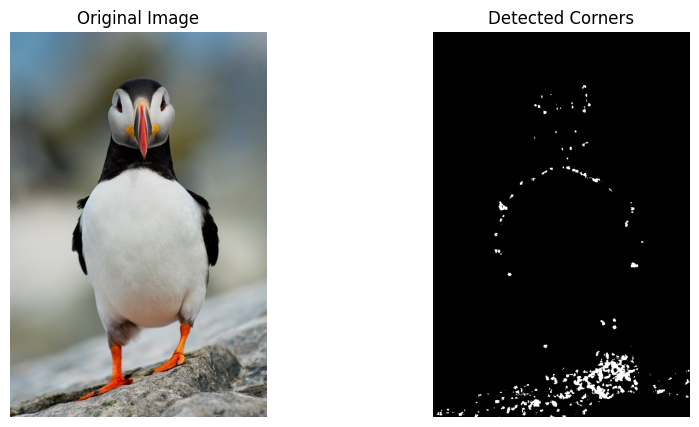

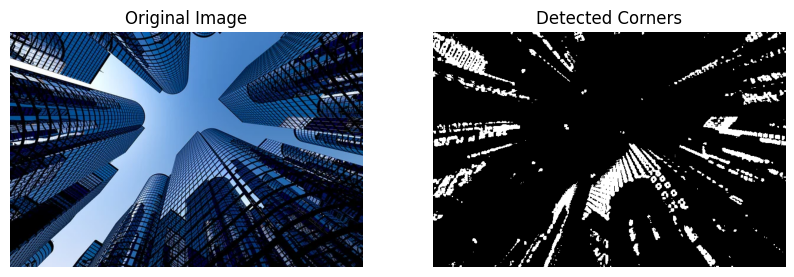

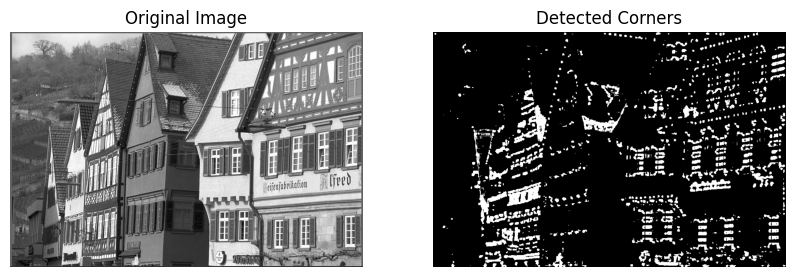

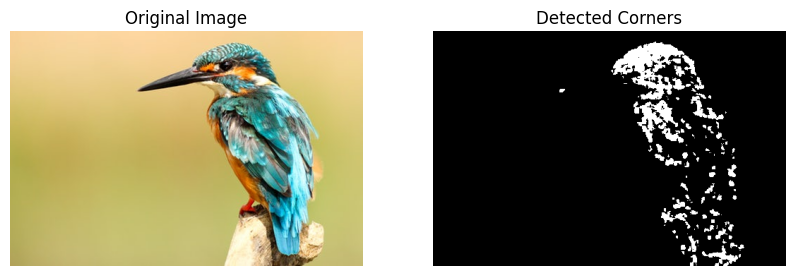

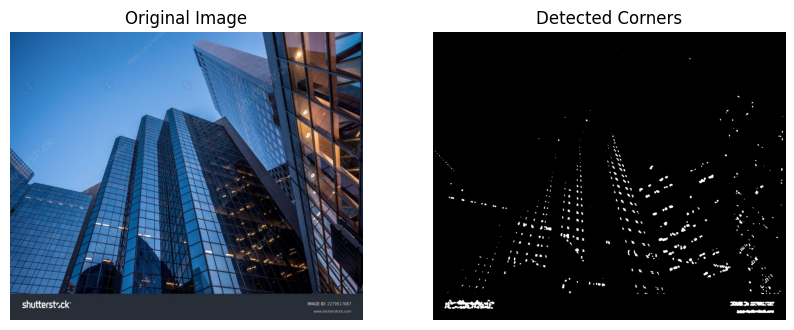

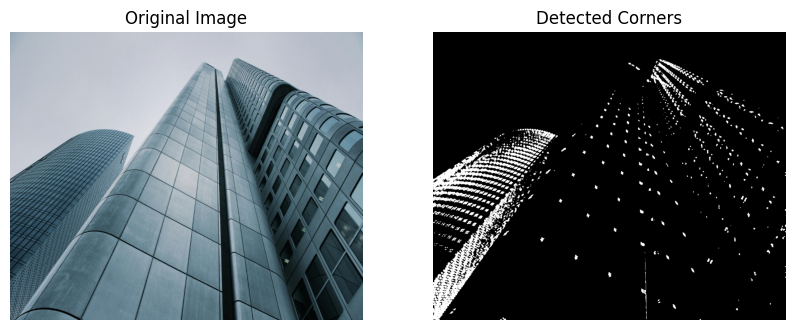

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio


path = '/content/drive/My Drive/m22ee002'


file_names = os.listdir(path)


imagesfiles = [file for file in file_names if file.endswith(('png', 'jpg', 'jpeg', 'gif'))]


def detect_corners(image):

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


    dst = cv2.cornerHarris(gray, blockSize=5, ksize=3, k=0.04)


    threshold = 0.01 * dst.max()
    corner_image = np.zeros_like(image)
    corner_image[dst > threshold] = [255, 255, 255]

    return corner_image


for ima_file in imagesfiles:

    image_path = os.path.join(path, ima_file)
    try:
        if ima_file.endswith('.gif'):

            gif = imageio.get_reader(image_path)
            for frame in gif:

                corner_image = detect_corners(frame)


                plt.figure(figsize=(10, 5))
                plt.subplot(1, 2, 1)
                plt.imshow(frame)
                plt.title('Original Frame')
                plt.axis('off')

                plt.subplot(1, 2, 2)
                plt.imshow(corner_image)
                plt.title('Detected Corners')
                plt.axis('off')

                plt.show()
        else:
            image = cv2.imread(image_path)

            if image is None:
                print(f"Error: Unable to load image {image_path}")
                continue


            corner_image = detect_corners(image)


            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            plt.title('Original Image')
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(cv2.cvtColor(corner_image, cv2.COLOR_BGR2RGB))
            plt.title('Detected Corners')
            plt.axis('off')

            plt.show()
    except Exception as e:
        print(f"Error: Unable to process image {image_path}: {e}")


#   harris Corner detection from scratch with window size:3 and thresold value -  0.0001,0.03,  0.1

Processing 1.gif: Shape=(1024, 791, 4)
Processing 5.jpg: Shape=(240, 360, 3)
Processing 11.jpg: Shape=(299, 500, 3)
Processing 10.jpg: Shape=(518, 612)
Processing 9.jpeg: Shape=(751, 500, 3)
Processing 8.jpg: Shape=(400, 600, 3)
Processing 3.png: Shape=(512, 768)
Processing 2.jpeg: Shape=(333, 500, 3)
Processing 6.jpg: Shape=(900, 1100, 3)
Processing 7.jpg: Shape=(900, 1100, 3)


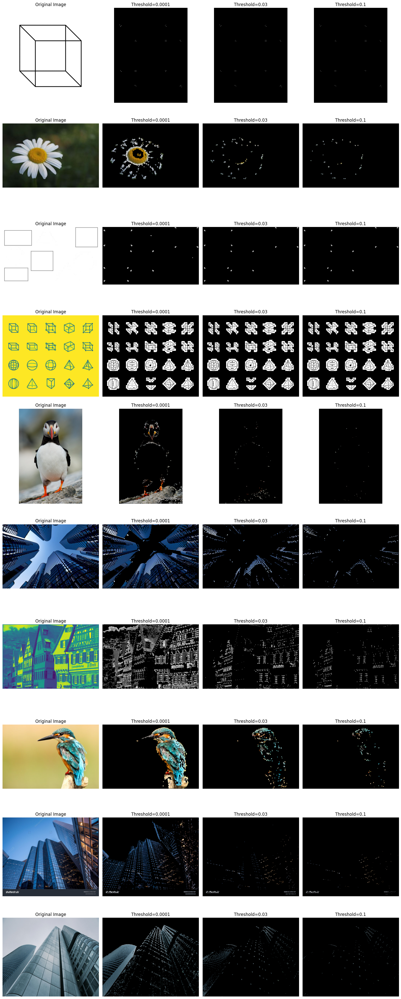

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt


def convolved(image, kernel):
    m, n = image.shape
    km, kn = kernel.shape
    kh, kw = km // 2, kn // 2
    conresult = np.zeros_like(image)

    for i in range(kh, m - kh):
        for j in range(kw, n - kw):
            conresult[i, j] = np.sum(image[i-kh:i+kh+1, j-kw:j+kw+1] * kernel)

    return conresult


def computeharris(image, k=0.04, winsize=3):

    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

    Ix = convolved(image, sobel_x)
    Iy = convolved(image, sobel_y)

    Ixx = Ix * Ix
    Iyy = Iy * Iy
    Ixy = Ix * Iy

    Sxx = convolved(Ixx, np.ones((winsize, winsize)))
    Syy = convolved(Iyy, np.ones((winsize, winsize)))
    Sxy = convolved(Ixy, np.ones((winsize, winsize)))


    det = Sxx * Syy - Sxy**2
    trace = Sxx + Syy


    return det - k * trace**2


def nonmaximum(response, threshold=0.01, kernel_size=3):

    response[response < threshold * response.max()] = 0


    return response == convolved(response, np.ones((kernel_size, kernel_size)))


folder_path = '/content/drive/My Drive/m22ee002/'


file_names = os.listdir(folder_path)


fig, axs = plt.subplots(len(file_names), len([0.0001, 0.03, 0.1]) + 1, figsize=(16, len(file_names) * 4))


for i, file_name in enumerate(file_names):

    if not file_name.lower().endswith(('.jpg', '.jpeg', '.png', '.gif')):
        continue

    imagepath = os.path.join(folder_path, file_name)
    image = plt.imread(imagepath)

    print(f'Processing {file_name}: Shape={image.shape}')


    if len(image.shape) == 3 and image.shape[2] == 4:

        image = image[:, :, :3]


    if len(image.shape) == 3 and image.shape[2] == 3:

        gray = np.mean(image, axis=2)
    else:
        gray = image


    axs[i, 0].imshow(image)
    axs[i, 0].set_title('Original Image')
    axs[i, 0].axis('off')


    for j, threshold in enumerate([0.0001, 0.03, 0.1]):
        response = computeharris(gray, winsize=3)


        corners = nonmaximum(response, threshold=threshold, kernel_size=3)


        if len(image.shape) == 3:
            imagcopy = np.copy(image)
            imagcopy[corners] = [0, 0, 0]
            axs[i, j + 1].imshow(imagcopy.astype(np.uint8))
        else:
            imagcopy = np.copy(gray)
            imagcopy[corners] = 0
            axs[i, j + 1].imshow(imagcopy, cmap='gray')

        axs[i, j + 1].set_title(f'Threshold={threshold}')
        axs[i, j + 1].axis('off')

plt.tight_layout()
plt.show()


# harris Corner detection from scratch with window size:5 and thresold value - 0.0001,0.03, 0.1

Processing 1.gif: Shape=(1024, 791, 4)
Processing 5.jpg: Shape=(240, 360, 3)
Processing 11.jpg: Shape=(299, 500, 3)
Processing 10.jpg: Shape=(518, 612)
Processing 9.jpeg: Shape=(751, 500, 3)
Processing 8.jpg: Shape=(400, 600, 3)
Processing 3.png: Shape=(512, 768)
Processing 2.jpeg: Shape=(333, 500, 3)
Processing 6.jpg: Shape=(900, 1100, 3)
Processing 7.jpg: Shape=(900, 1100, 3)


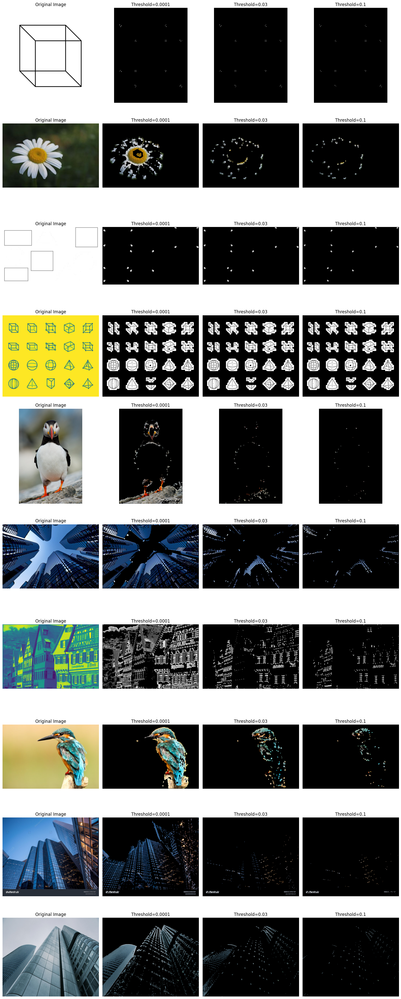

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt


def convolved(image, kernel):
    m, n = image.shape
    km, kn = kernel.shape
    kh, kw = km // 2, kn // 2
    conresult = np.zeros_like(image)

    for i in range(kh, m - kh):
        for j in range(kw, n - kw):
            conresult[i, j] = np.sum(image[i-kh:i+kh+1, j-kw:j+kw+1] * kernel)

    return conresult


def computeharris(image, k=0.04, winsize=5):  # Updated window size to 5
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

    Ix = convolved(image, sobel_x)
    Iy = convolved(image, sobel_y)

    Ixx = Ix * Ix
    Iyy = Iy * Iy
    Ixy = Ix * Iy

    Sxx = convolved(Ixx, np.ones((winsize, winsize)))
    Syy = convolved(Iyy, np.ones((winsize, winsize)))
    Sxy = convolved(Ixy, np.ones((winsize, winsize)))

    det = Sxx * Syy - Sxy**2
    trace = Sxx + Syy

    return det - k * trace**2


def nonmaximum(response, threshold=0.01, kernel_size=3):
    response[response < threshold * response.max()] = 0

    return response == convolved(response, np.ones((kernel_size, kernel_size)))


folder_path = '/content/drive/My Drive/m22ee002/'

file_names = os.listdir(folder_path)

fig, axs = plt.subplots(len(file_names), len([0.0001, 0.03, 0.1]) + 1, figsize=(16, len(file_names) * 4))

for i, file_name in enumerate(file_names):
    if not file_name.lower().endswith(('.jpg', '.jpeg', '.png', '.gif')):
        continue

    imagepath = os.path.join(folder_path, file_name)
    image = plt.imread(imagepath)

    print(f'Processing {file_name}: Shape={image.shape}')

    if len(image.shape) == 3 and image.shape[2] == 4:
        image = image[:, :, :3]

    if len(image.shape) == 3 and image.shape[2] == 3:
        gray = np.mean(image, axis=2)
    else:
        gray = image

    axs[i, 0].imshow(image)
    axs[i, 0].set_title('Original Image')
    axs[i, 0].axis('off')

    for j, threshold in enumerate([0.0001, 0.03, 0.1]):
        response = computeharris(gray, winsize=5)

        corners = nonmaximum(response, threshold=threshold, kernel_size=3)

        if len(image.shape) == 3:
            imagcopy = np.copy(image)
            imagcopy[corners] = [0, 0, 0]
            axs[i, j + 1].imshow(imagcopy.astype(np.uint8))
        else:
            imagcopy = np.copy(gray)
            imagcopy[corners] = 0
            axs[i, j + 1].imshow(imagcopy, cmap='gray')

        axs[i, j + 1].set_title(f'Threshold={threshold}')
        axs[i, j + 1].axis('off')

plt.tight_layout()
plt.show()


# harris Corner detection from scratch with window size:7 and thresold value - 0.0001,0.03, 0.1

Processing 1.gif: Shape=(1024, 791, 4)
Processing 5.jpg: Shape=(240, 360, 3)
Processing 11.jpg: Shape=(299, 500, 3)
Processing 10.jpg: Shape=(518, 612)
Processing 9.jpeg: Shape=(751, 500, 3)
Processing 8.jpg: Shape=(400, 600, 3)
Processing 3.png: Shape=(512, 768)
Processing 2.jpeg: Shape=(333, 500, 3)
Processing 6.jpg: Shape=(900, 1100, 3)
Processing 7.jpg: Shape=(900, 1100, 3)


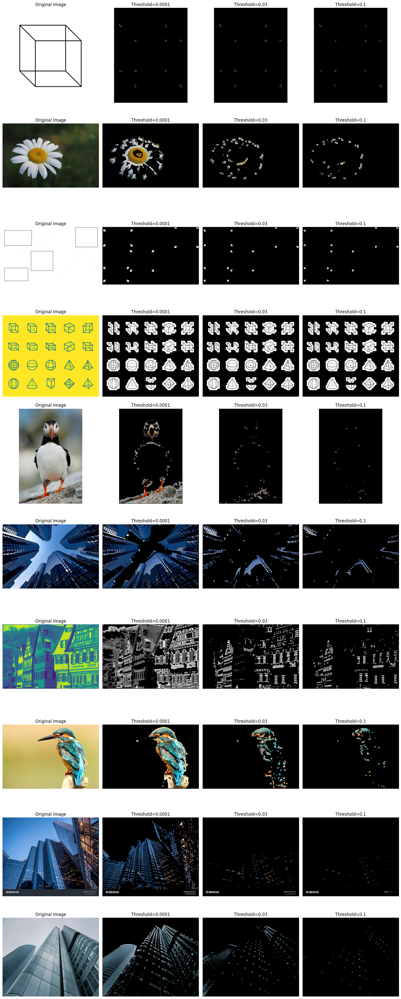

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt


def convolved(image, kernel):
    m, n = image.shape
    km, kn = kernel.shape
    kh, kw = km // 2, kn // 2
    conresult = np.zeros_like(image)

    for i in range(kh, m - kh):
        for j in range(kw, n - kw):
            conresult[i, j] = np.sum(image[i-kh:i+kh+1, j-kw:j+kw+1] * kernel)

    return conresult


def computeharris(image, k=0.04, winsize=7):  # Updated window size to 7
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

    Ix = convolved(image, sobel_x)
    Iy = convolved(image, sobel_y)

    Ixx = Ix * Ix
    Iyy = Iy * Iy
    Ixy = Ix * Iy

    Sxx = convolved(Ixx, np.ones((winsize, winsize)))
    Syy = convolved(Iyy, np.ones((winsize, winsize)))
    Sxy = convolved(Ixy, np.ones((winsize, winsize)))

    det = Sxx * Syy - Sxy**2
    trace = Sxx + Syy

    return det - k * trace**2


def nonmaximum(response, threshold=0.01, kernel_size=3):
    response[response < threshold * response.max()] = 0

    return response == convolved(response, np.ones((kernel_size, kernel_size)))


folder_path = '/content/drive/My Drive/m22ee002/'

file_names = os.listdir(folder_path)

fig, axs = plt.subplots(len(file_names), len([0.0001, 0.03, 0.1]) + 1, figsize=(16, len(file_names) * 4))

for i, file_name in enumerate(file_names):
    if not file_name.lower().endswith(('.jpg', '.jpeg', '.png', '.gif')):
        continue

    imagepath = os.path.join(folder_path, file_name)
    image = plt.imread(imagepath)

    print(f'Processing {file_name}: Shape={image.shape}')

    if len(image.shape) == 3 and image.shape[2] == 4:
        image = image[:, :, :3]

    if len(image.shape) == 3 and image.shape[2] == 3:
        gray = np.mean(image, axis=2)
    else:
        gray = image

    axs[i, 0].imshow(image)
    axs[i, 0].set_title('Original Image')
    axs[i, 0].axis('off')

    for j, threshold in enumerate([0.0001, 0.03, 0.1]):
        response = computeharris(gray, winsize=7)  # Change window size to 7

        corners = nonmaximum(response, threshold=threshold, kernel_size=3)

        if len(image.shape) == 3:
            imagcopy = np.copy(image)
            imagcopy[corners] = [0, 0, 0]
            axs[i, j + 1].imshow(imagcopy.astype(np.uint8))
        else:
            imagcopy = np.copy(gray)
            imagcopy[corners] = 0
            axs[i, j + 1].imshow(imagcopy, cmap='gray')

        axs[i, j + 1].set_title(f'Threshold={threshold}')
        axs[i, j + 1].axis('off')

plt.tight_layout()
plt.show()
